In [1]:
import os
import torch
from matplotlib import pyplot as plt

from modules.utils import load_training_info, load_config, predict, plot
from modules.model import FootballNet
from modules.data import FootballDataset, FootballDataLoader

### **1. Experiment 1 Analysis**

In [2]:
EXPERIMENT_PATH = "outputs/exp_v1"

In [3]:
EXPERIMENT_CONFIG_PATH = os.path.join(EXPERIMENT_PATH, "experiment_config.json")
experiment_config = load_config(EXPERIMENT_CONFIG_PATH)

LOG_PATH = os.path.join(EXPERIMENT_PATH, "logs")
training_info = load_training_info(LOG_PATH, return_dataframes=True)

Found scalar tags: ['Loss/train', 'Loss/valid', 'Learning_Rate', 'Train/mean_iou', 'Train/mean_accuracy', 'Validation/mean_iou', 'Validation/mean_accuracy', 'Test/mean_iou', 'Test/mean_accuracy']


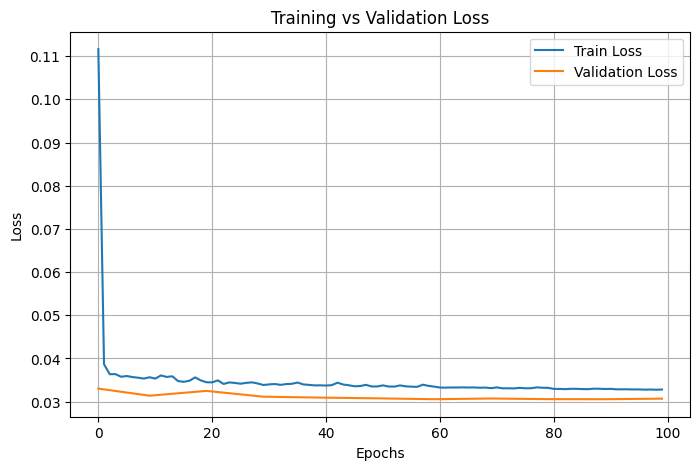

In [4]:
epochs = training_info["train_loss"]["epoch"]
train_loss = training_info["train_loss"]["loss"]
valid_epochs = training_info["valid_loss"]["epoch"]
valid_loss = training_info["valid_loss"]["loss"]

plt.figure(figsize=(8, 5))

plt.plot(epochs, train_loss, label="Train Loss")
plt.plot(valid_epochs, valid_loss, label="Validation Loss")

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)

plt.savefig("assets/loss_curve_1.png", dpi=300, bbox_inches="tight")
plt.show()

In [5]:
# Load datasets
train_dataset = FootballDataset(config=experiment_config.train_dataset_config)
train_dataloader = FootballDataLoader(config=experiment_config.train_dataloader_config, dataset=train_dataset)

valid_dataset = FootballDataset(config=experiment_config.valid_dataset_config)
valid_dataloader = FootballDataLoader(config=experiment_config.valid_dataloader_config, dataset=valid_dataset)

test_dataset = FootballDataset(config=experiment_config.test_dataset_config)
test_dataloader = FootballDataLoader(config=experiment_config.test_dataloader_config, dataset=test_dataset)

In [6]:
# Load model on CPU
MODEL_PATH = os.path.join(EXPERIMENT_PATH, "checkpoints", "epoch_100.pth")

# Initialize model
model = FootballNet(config=experiment_config.model_config)

# Load checkpoint and remap all tensors to CPU
state_dict = torch.load(MODEL_PATH, map_location=torch.device("mps"))

model.load_state_dict(state_dict)

# Ensure model is on CPU
model = model.to("mps")


In [7]:
train_preds = predict(train_dataloader, model, "mps", unnormalize_bbox=True)

Predicting:   0%|          | 0/15 [00:00<?, ?it/s]/Users/tobiojekanmi/Documents/Projects/python/ml-project/football-detection/.venv/lib/python3.13/site-packages/torch/utils/data/dataloader.py:692: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, device pinned memory won't be used.
  warnings.warn(warn_msg)
Predicting: 100%|██████████| 15/15 [00:17<00:00,  1.18s/it]


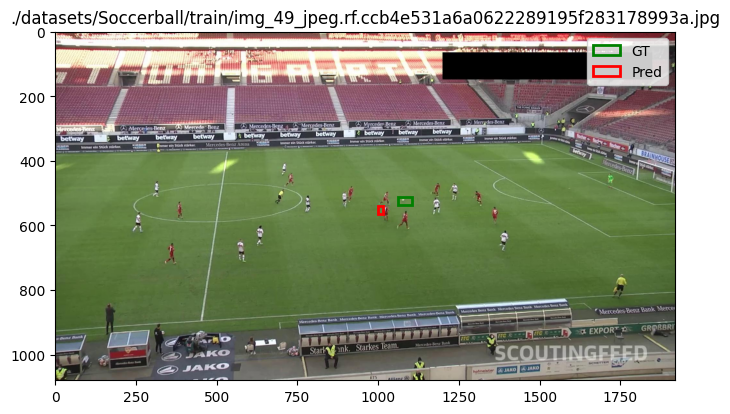

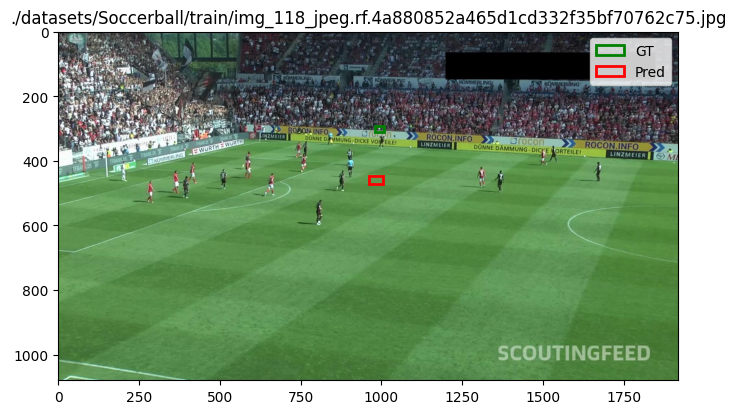

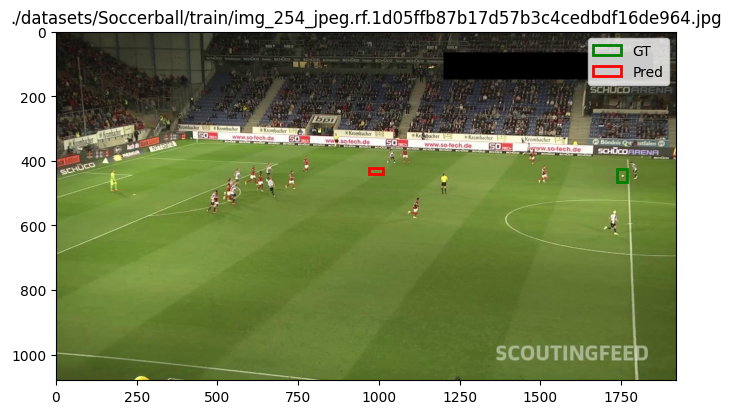

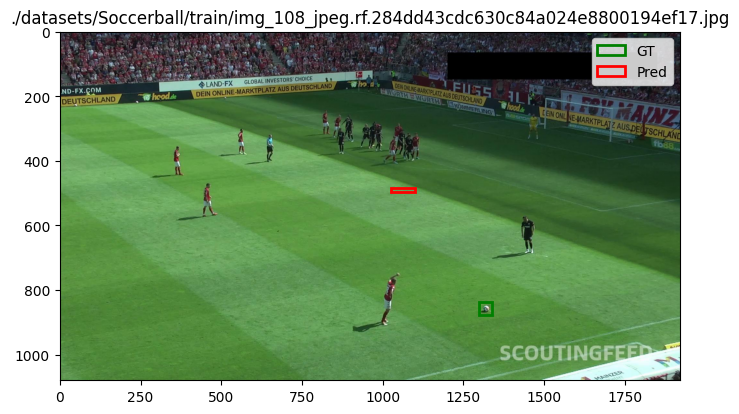

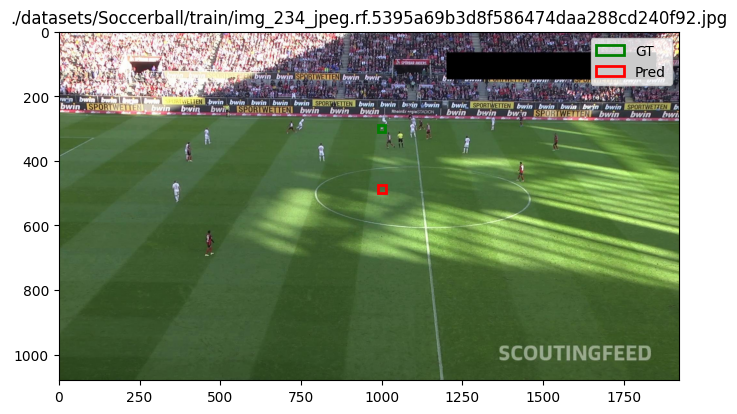

...

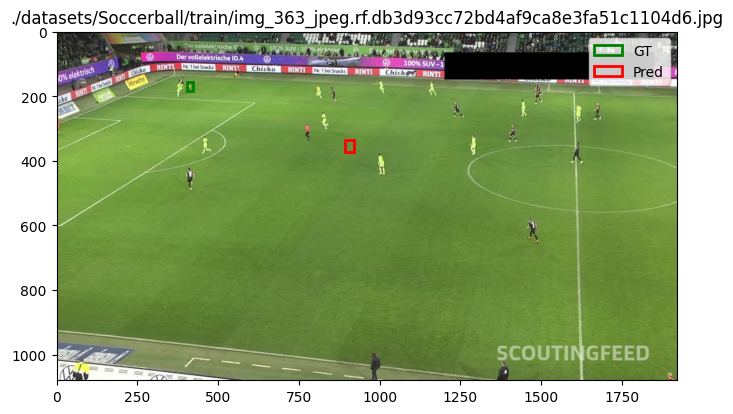

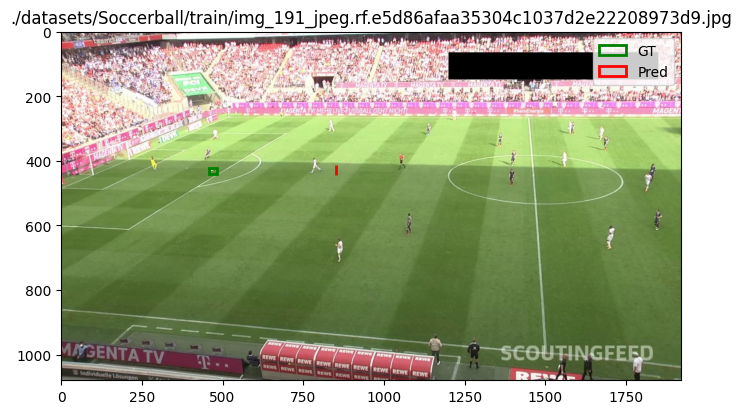

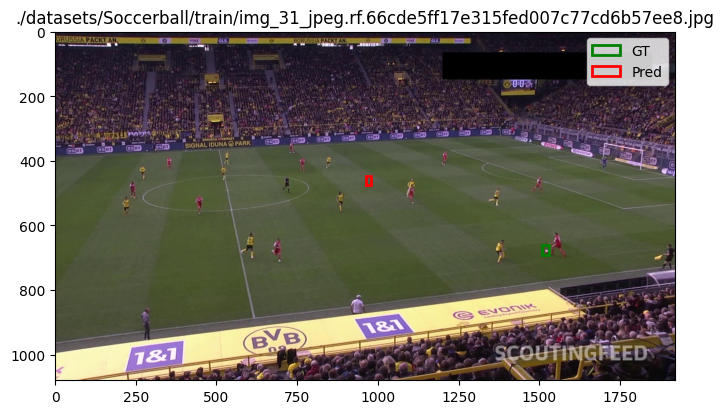

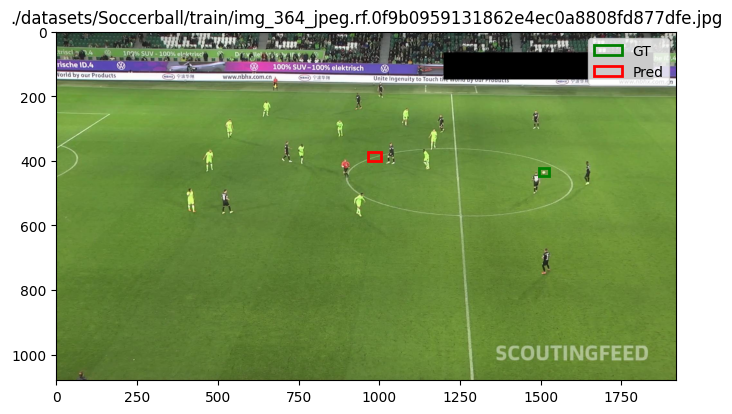

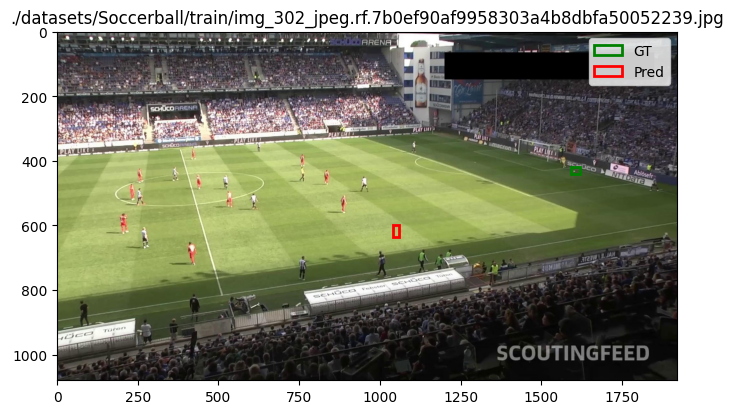

In [8]:
plot(train_preds, 12)

### **2. Experiment 2 Analysis**

In [9]:
EXPERIMENT_PATH = "outputs/exp_v2"

In [10]:
EXPERIMENT_CONFIG_PATH = os.path.join(EXPERIMENT_PATH, "experiment_config.json")
experiment_config = load_config(EXPERIMENT_CONFIG_PATH)

LOG_PATH = os.path.join(EXPERIMENT_PATH, "logs")
training_info = load_training_info(LOG_PATH, return_dataframes=True)

Found scalar tags: ['Loss/train', 'Loss/valid', 'Learning_Rate', 'Train/mean_iou', 'Train/mean_accuracy', 'Validation/mean_iou', 'Validation/mean_accuracy', 'Test/mean_iou', 'Test/mean_accuracy']


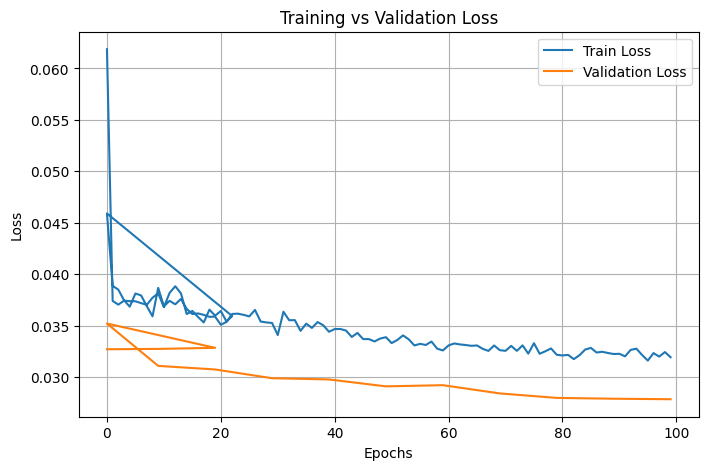

In [11]:
epochs = training_info["train_loss"]["epoch"]
train_loss = training_info["train_loss"]["loss"]
valid_epochs = training_info["valid_loss"]["epoch"]
valid_loss = training_info["valid_loss"]["loss"]

plt.figure(figsize=(8, 5))

plt.plot(epochs, train_loss, label="Train Loss")
plt.plot(valid_epochs, valid_loss, label="Validation Loss")

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)

plt.savefig("assets/loss_curve_2.png", dpi=300, bbox_inches="tight")
plt.show()

In [12]:
# Load datasets
train_dataset = FootballDataset(config=experiment_config.train_dataset_config)
train_dataloader = FootballDataLoader(config=experiment_config.train_dataloader_config, dataset=train_dataset)

valid_dataset = FootballDataset(config=experiment_config.valid_dataset_config)
valid_dataloader = FootballDataLoader(config=experiment_config.valid_dataloader_config, dataset=valid_dataset)

test_dataset = FootballDataset(config=experiment_config.test_dataset_config)
test_dataloader = FootballDataLoader(config=experiment_config.test_dataloader_config, dataset=test_dataset)

In [13]:
# Load model on CPU
MODEL_PATH = os.path.join(EXPERIMENT_PATH, "checkpoints", "epoch_100.pth")

# Initialize model
model = FootballNet(config=experiment_config.model_config)

# Load checkpoint and remap all tensors to CPU
state_dict = torch.load(MODEL_PATH, map_location=torch.device("mps"))

model.load_state_dict(state_dict)

# Ensure model is on CPU
model = model.to("mps")


In [14]:
train_preds = predict(train_dataloader, model, "mps", unnormalize_bbox=True)

Predicting:   0%|          | 0/29 [00:00<?, ?it/s]/Users/tobiojekanmi/Documents/Projects/python/ml-project/football-detection/.venv/lib/python3.13/site-packages/torch/utils/data/dataloader.py:692: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, device pinned memory won't be used.
  warnings.warn(warn_msg)
Predicting: 100%|██████████| 29/29 [00:21<00:00,  1.37it/s]


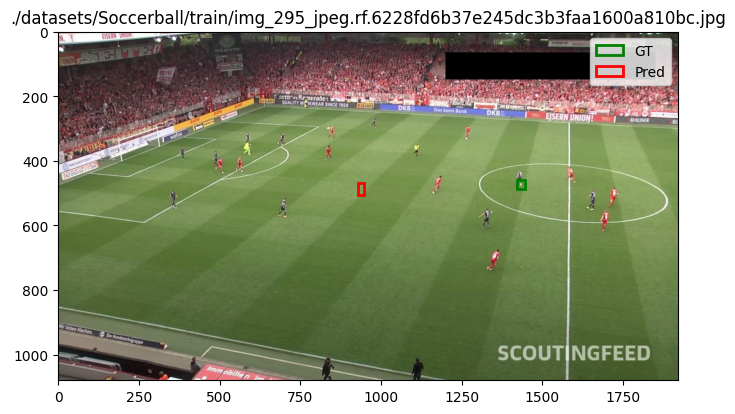

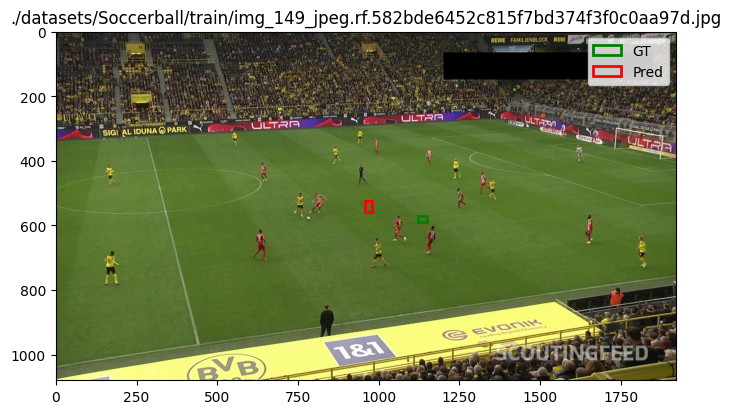

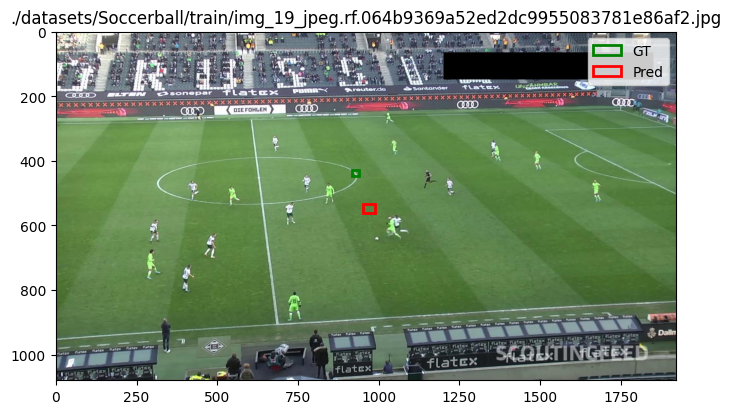

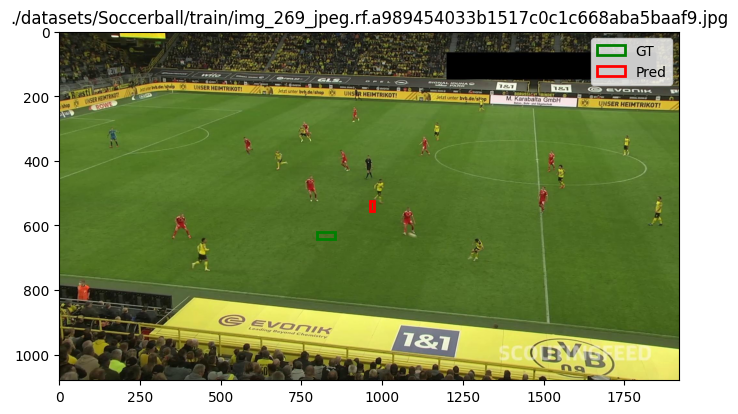

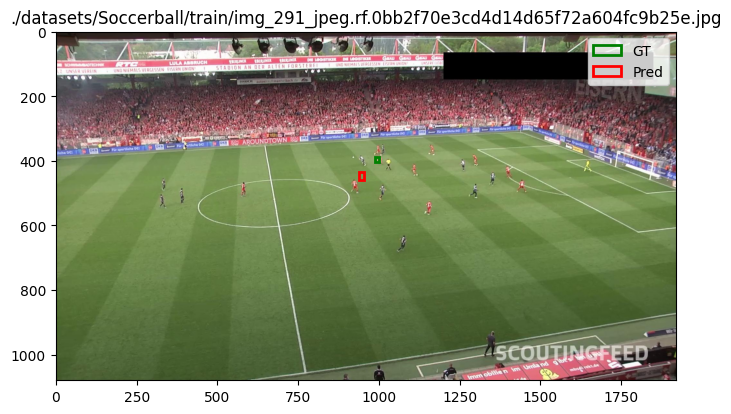

...

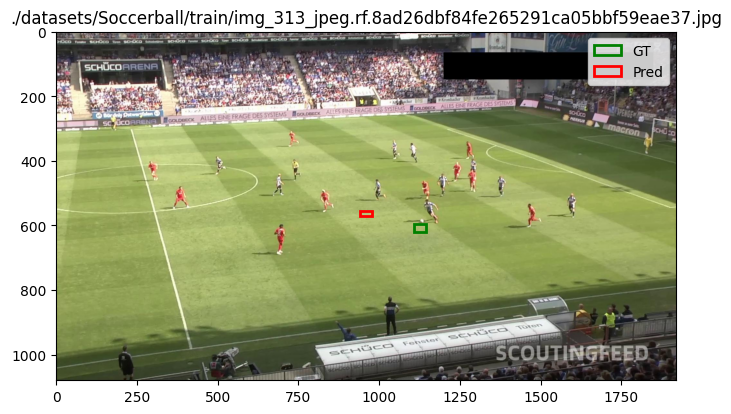

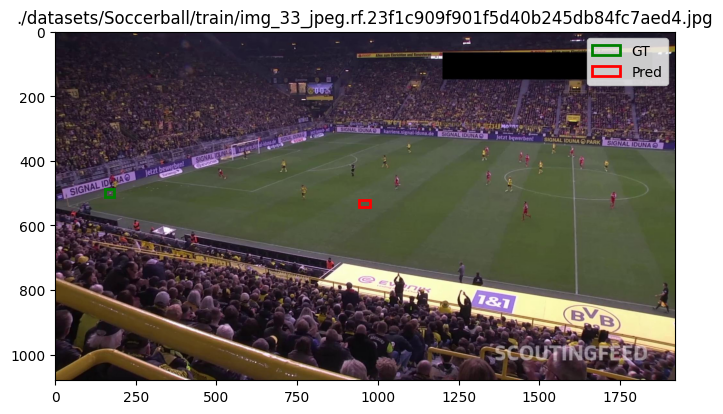

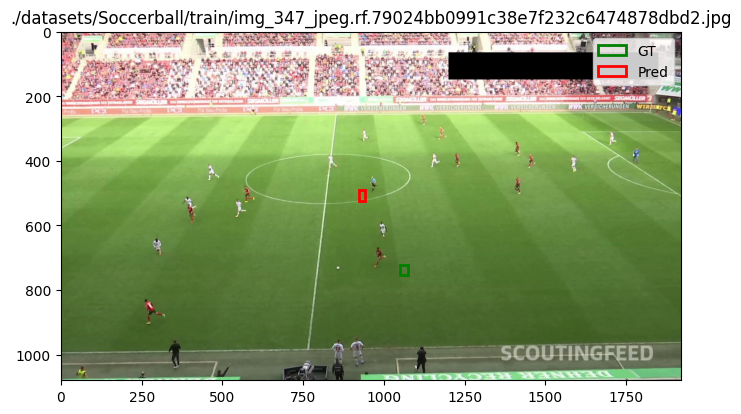

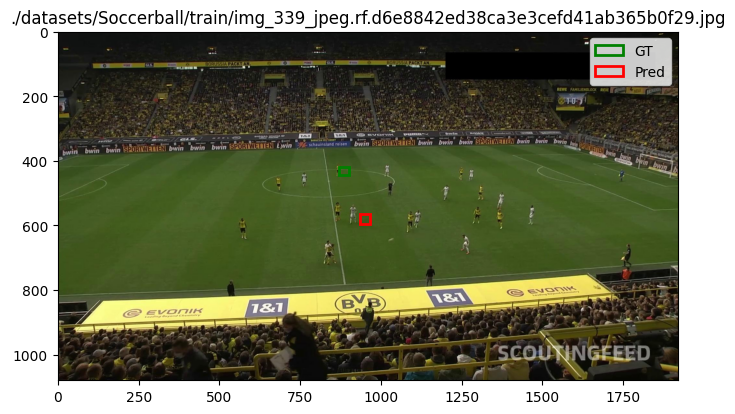

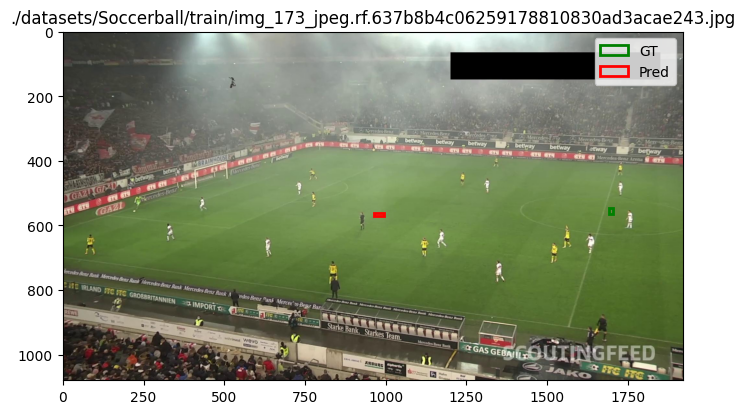

In [15]:
plot(train_preds, 12)

### **3. Experiment 3 Analysis**

In [16]:
EXPERIMENT_PATH = "outputs/exp_v3"

In [17]:
EXPERIMENT_CONFIG_PATH = os.path.join(EXPERIMENT_PATH, "experiment_config.json")
experiment_config = load_config(EXPERIMENT_CONFIG_PATH)

LOG_PATH = os.path.join(EXPERIMENT_PATH, "logs")
training_info = load_training_info(LOG_PATH, return_dataframes=True)

Found scalar tags: ['Loss/train', 'Loss/valid', 'Learning_Rate', 'Train/mean_iou', 'Train/mean_accuracy', 'Validation/mean_iou', 'Validation/mean_accuracy', 'Test/mean_iou', 'Test/mean_accuracy']


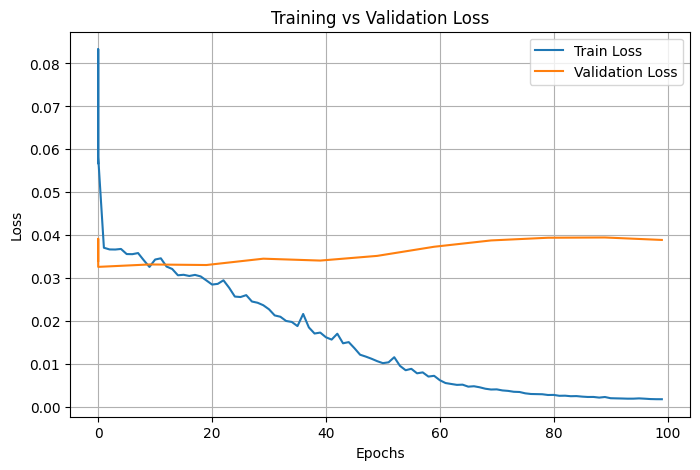

In [18]:
epochs = training_info["train_loss"]["epoch"]
train_loss = training_info["train_loss"]["loss"]
valid_epochs = training_info["valid_loss"]["epoch"]
valid_loss = training_info["valid_loss"]["loss"]

plt.figure(figsize=(8, 5))

plt.plot(epochs, train_loss, label="Train Loss")
plt.plot(valid_epochs, valid_loss, label="Validation Loss")

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)

plt.savefig("assets/loss_curve_3.png", dpi=300, bbox_inches="tight")
plt.show()

In [19]:
# Load datasets
train_dataset = FootballDataset(config=experiment_config.train_dataset_config)
train_dataloader = FootballDataLoader(config=experiment_config.train_dataloader_config, dataset=train_dataset)

valid_dataset = FootballDataset(config=experiment_config.valid_dataset_config)
valid_dataloader = FootballDataLoader(config=experiment_config.valid_dataloader_config, dataset=valid_dataset)

test_dataset = FootballDataset(config=experiment_config.test_dataset_config)
test_dataloader = FootballDataLoader(config=experiment_config.test_dataloader_config, dataset=test_dataset)

In [20]:
# Load model on CPU
MODEL_PATH = os.path.join(EXPERIMENT_PATH, "checkpoints", "epoch_100.pth")

# Initialize model
model = FootballNet(config=experiment_config.model_config)

# Load checkpoint and remap all tensors to CPU
state_dict = torch.load(MODEL_PATH, map_location=torch.device("mps"))

model.load_state_dict(state_dict)

# Ensure model is on CPU
model = model.to("mps")


In [21]:
train_preds = predict(train_dataloader, model, "mps", unnormalize_bbox=True)

Predicting:   0%|          | 0/29 [00:00<?, ?it/s]/Users/tobiojekanmi/Documents/Projects/python/ml-project/football-detection/.venv/lib/python3.13/site-packages/torch/utils/data/dataloader.py:692: UserWarning: 'pin_memory' argument is set as true but not supported on MPS now, device pinned memory won't be used.
  warnings.warn(warn_msg)
Predicting: 100%|██████████| 29/29 [00:21<00:00,  1.33it/s]


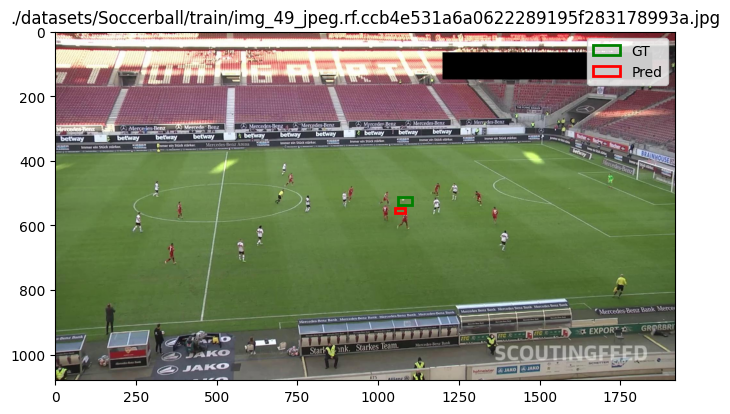

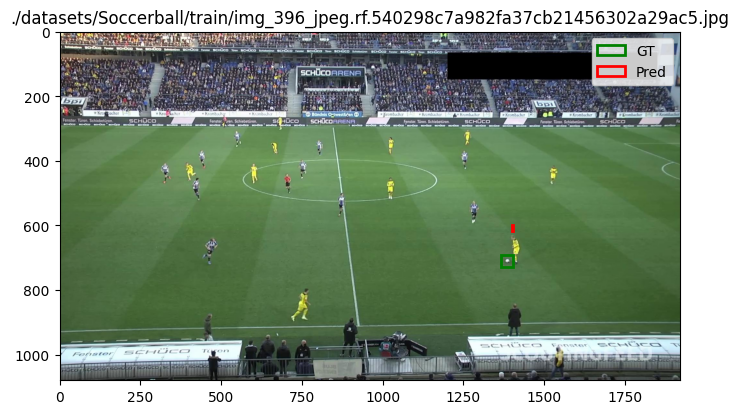

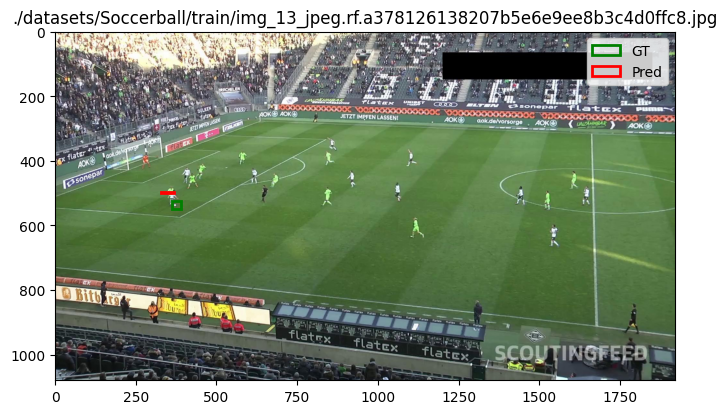

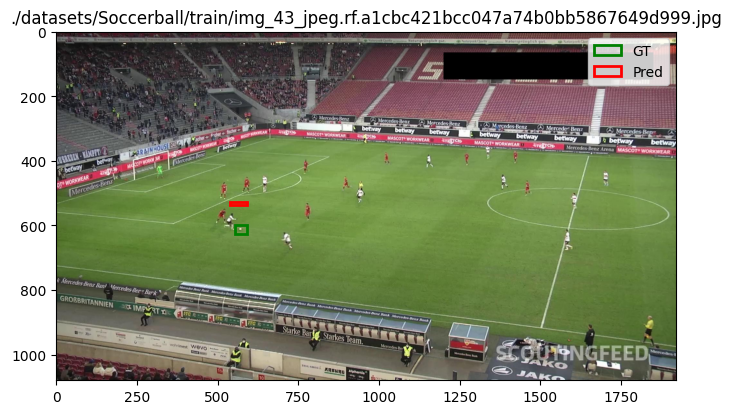

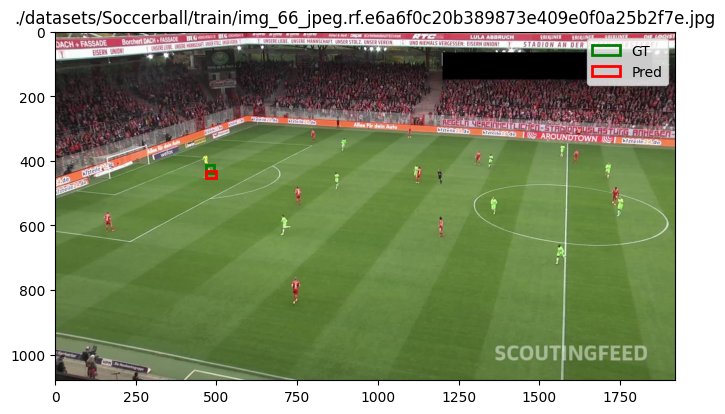

...

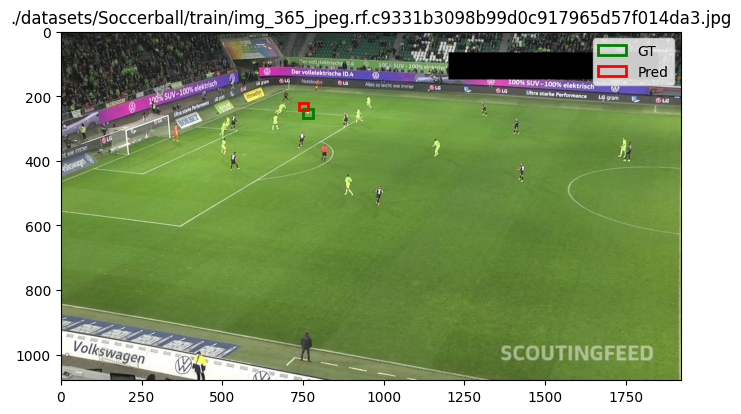

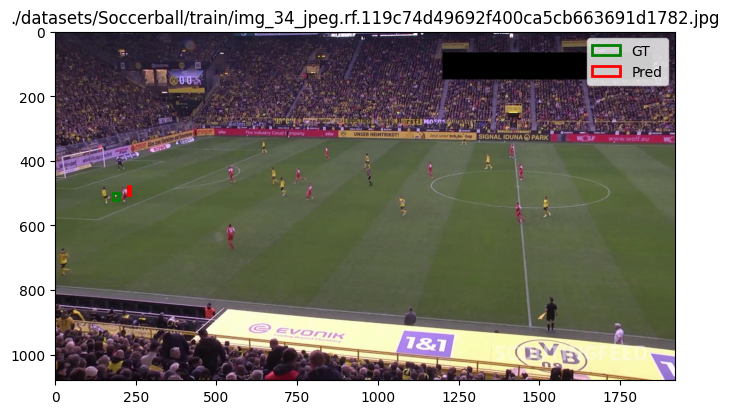

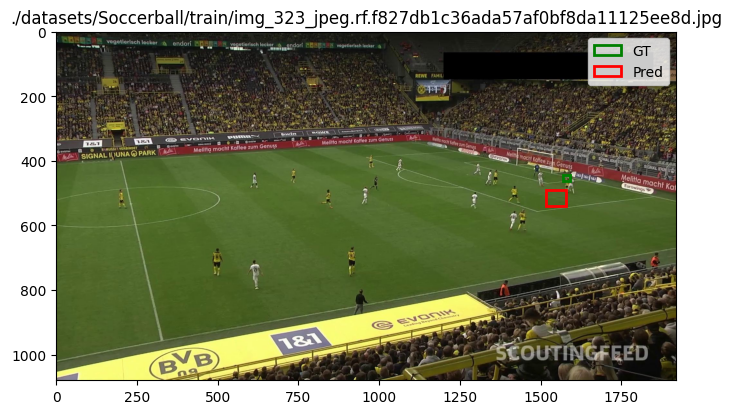

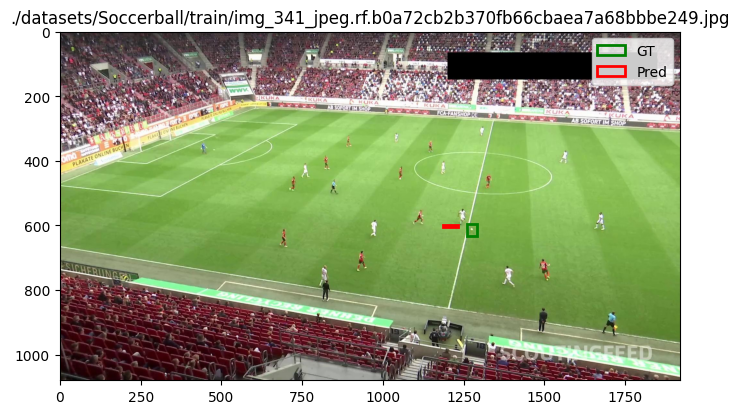

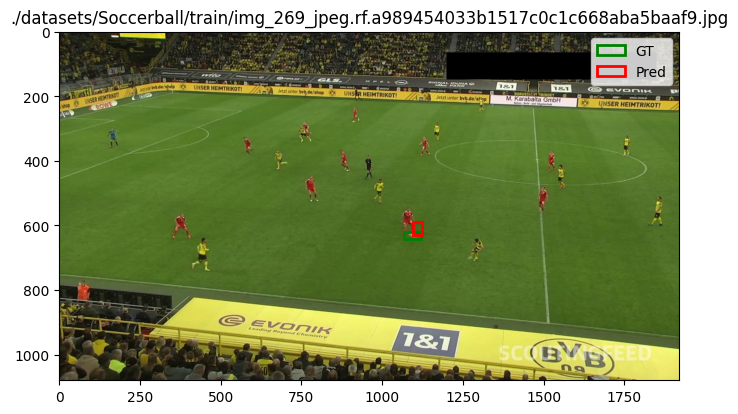

In [22]:
plot(train_preds, 12)